<a href="https://colab.research.google.com/github/adabiratsi/Deep-Learning/blob/main/VGG16.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
os.environ['KAGGLE_USERNAME']= "dimitrissofos"
os.environ['KAGGLE_KEY']= "ce13fef601441969c763d024cd4bfb1b"


In [ ]:

!kaggle datasets download tawsifurrahman/covid19-radiography-database


covid19-radiography-database.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:

!unzip covid19-radiography-database.zip


In [ ]:
len(os.listdir('COVID-19_Radiography_Dataset/COVID/'))

len(os.listdir('COVID-19_Radiography_Dataset/COVID/images'))

len(os.listdir('COVID-19_Radiography_Dataset/Normal/images'))


10192

In [ ]:
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import numpy as np


In [ ]:
img= cv2.imread('/content/COVID-19_Radiography_Dataset/Normal/images/Normal-10006.png')

In [ ]:
df= pd.read_excel('COVID-19_Radiography_Dataset/COVID.metadata.xlsx')

In [ ]:

plt.imshow(img)


In [ ]:

img.shape


(299, 299, 3)

In [ ]:
import glob
import shutil
import cv2
import os
from PIL import Image
import seaborn as sns
import numpy as np
from matplotlib import pyplot as plt
import tensorflow as tf
from tensorflow.keras.layers import *
from tensorflow.keras.models import *
from tensorflow.keras.preprocessing import *
from keras.applications.vgg16 import VGG16
from keras import layers

# from skimage.feature import local_binary_pattern

import warnings
# Ignore waring
warnings.filterwarnings('ignore')


In [ ]:
name_list = glob.glob("COVID-19_Radiography_Dataset/COVID/images/*")

labels = ['NORMAL', 'Covid']

#Load the training images and labels
X= []
y = []
for name in name_list:
  y.append(1)
  img = cv2.imread(name)
  img = tf.keras.preprocessing.image.img_to_array(img)
  img = cv2.resize(img,(128,128))

  X.append((img))
# print(X)


In [ ]:

name_list = glob.glob("COVID-19_Radiography_Dataset/Normal/images/*")

for name in name_list:
  y.append(0)
  img = cv2.imread(name)
  img = tf.keras.preprocessing.image.img_to_array(img)
  img = cv2.resize(img,(128,128))
  X.append((img))
len(X)


13808

In [ ]:
X = np.array(X)
y = np.array(y).reshape(-1,1)


In [ ]:
print(len(X))
print(X.shape)
print(y.shape)


In [ ]:
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.applications.vgg16 import VGG16
from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential

# Split the data into train, validation, and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)
X_test, X_val, y_test, y_val = train_test_split(X_test, y_test, test_size=0.2, random_state=42)

print("Training set shape:", X_train.shape)
print("Validation set shape:", X_val.shape)
print("Test set shape:", X_test.shape)

Training set shape: (12427, 128, 128, 3)
Validation set shape: (277, 128, 128, 3)
Test set shape: (1104, 128, 128, 3)


In [ ]:
# Scale the pixel values to the range [0, 1]
X_train = X_train / 255.0
X_test_scaled = X_test / 255.0
X_val = X_val / 255.0

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten

# Create an instance of the VGG16 model
vgg_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the pre-trained layers
for layer in vgg_model.layers:
    layer.trainable = False

# Create a new model and add the VGG16 base
model = Sequential()
model.add(vgg_model)

58889256/58889256 [==============================] - 2s 0us/step


In [ ]:
model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dense(5, activation='softmax'))

# Compile the model
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Set up data augmentation
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

In [ ]:
# Define the base model (VGG16)
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(128, 128, 3))

# Freeze the layers of the VGG16 model
for layer in base_model.layers:
    layer.trainable = False

In [ ]:
# Create the model
model = Sequential()
model.add(base_model)
model.add(Flatten())
model.add(Dense(1024))
model.add(Activation("relu"))
model.add(Dense(512))
model.add(Activation("relu"))
model.add(Dense(1))
model.add(Activation("sigmoid"))

# Print the model summary
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 4, 4, 512)         14714688  
                                                                 
 flatten_2 (Flatten)         (None, 8192)              0         
                                                                 
 dense_4 (Dense)             (None, 1024)              8389632   
                                                                 
 activation (Activation)     (None, 1024)              0         
                                                                 
 dense_5 (Dense)             (None, 512)               524800    
                                                                 
 activation_1 (Activation)   (None, 512)               0         
                                                                 
 dense_6 (Dense)             (None, 1)                

In [ ]:
# Data augmentation
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True
)

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
# Example of using data augmentation during training
augmented_data_generator = datagen.flow(X_train, y_train, batch_size=32)
history = model.fit(augmented_data_generator, validation_data=(X_val, y_val), epochs=5)

Epoch 1/5
389/389 [==============================] - 2604s 7s/step - loss: 0.4066 - accuracy: 0.8237 - val_loss: 0.2582 - val_accuracy: 0.9025
Epoch 2/5
389/389 [==============================] - 2623s 7s/step - loss: 0.3332 - accuracy: 0.8602 - val_loss: 0.1971 - val_accuracy: 0.9314
Epoch 3/5
389/389 [==============================] - 2604s 7s/step - loss: 0.3188 - accuracy: 0.8650 - val_loss: 0.3191 - val_accuracy: 0.8520
Epoch 4/5
389/389 [==============================] - 2626s 7s/step - loss: 0.2878 - accuracy: 0.8764 - val_loss: 0.2151 - val_accuracy: 0.9170
Epoch 5/5
389/389 [==============================] - 2618s 7s/step - loss: 0.2721 - accuracy: 0.8882 - val_loss: 0.1799 - val_accuracy: 0.9242


In [ ]:
from matplotlib import pyplot  as plt
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train','test'],loc ='upper left')
plt.show()
#summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train','val'],loc ='upper left')
plt.show()

In [ ]:
y_hat = model.predict(X_test_scaled)
def predict(y_hat):
    y_hat[y_hat >= 0.5] =1
    y_hat[y_hat<0.5] =0
    return y_hat
y_pred = predict(y_hat)
from sklearn.metrics import accuracy_score
accuracy = accuracy_score(y_test, y_pred)
print(accuracy)
result= []
real_result = []
for i in y_pred:
    if i==0:
        result.append('Normal')
    if i==1:
        result.append('Covid')
for i in y_pred:
    if i==0:
        real_result.append('Normal')
    if i==1:
        real_result.append('Covid')

35/35 [==============================] - 223s 6s/step
0.9193840579710145


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
labels = ['Covid', 'Normal']
report = classification_report(y_test, y_pred, target_names=labels)
print(report)
accuracy = accuracy_score(y_test, y_pred)

print(f"Accuracy: {accuracy}")

              precision    recall  f1-score   support

       Covid       0.91      0.98      0.95       804
      Normal       0.94      0.75      0.84       300

    accuracy                           0.92      1104
   macro avg       0.93      0.87      0.89      1104
weighted avg       0.92      0.92      0.92      1104

Accuracy: 0.9193840579710145


[[789  15]
 [ 74 226]]


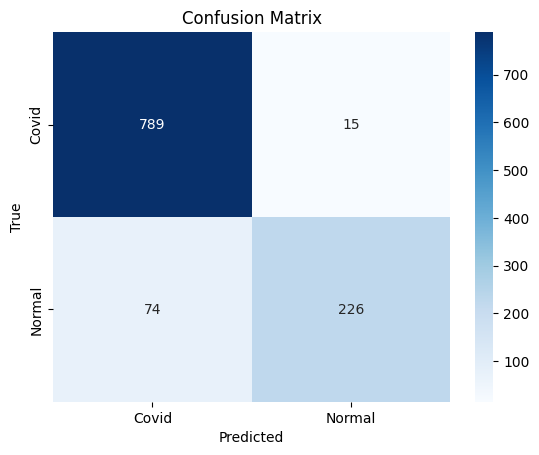

In [ ]:
cm = confusion_matrix(y_test, y_pred)
print(cm)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')


tick_labels = ['Covid', 'Normal']
plt.xticks(np.arange(len(tick_labels)) + 0.5, tick_labels)
plt.yticks(np.arange(len(tick_labels)) + 0.5, tick_labels)

#
plt.xlabel('Predicted')
plt.ylabel('True')

#
plt.title('Confusion Matrix')
plt.show()

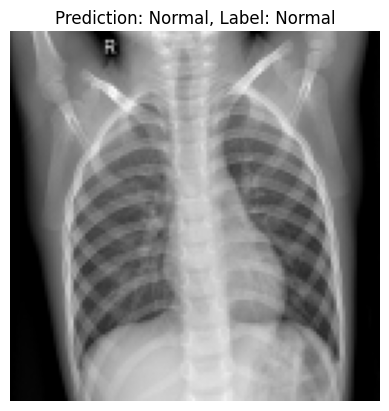

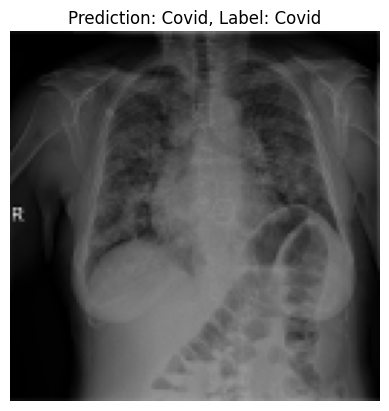

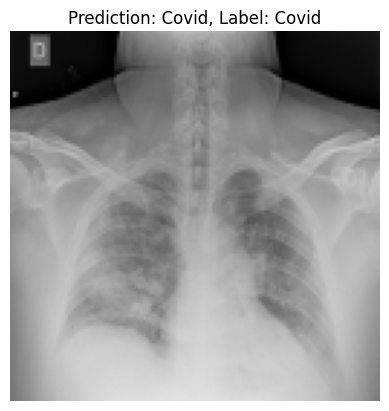

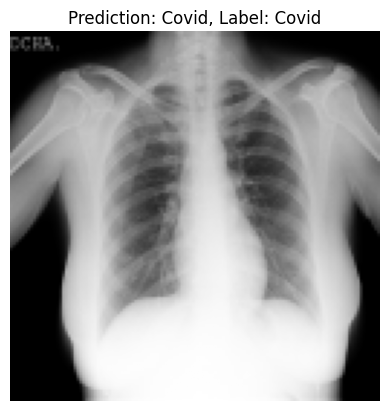

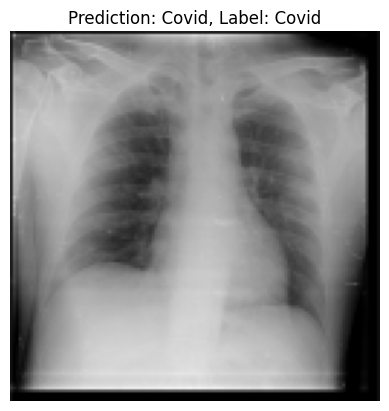

...

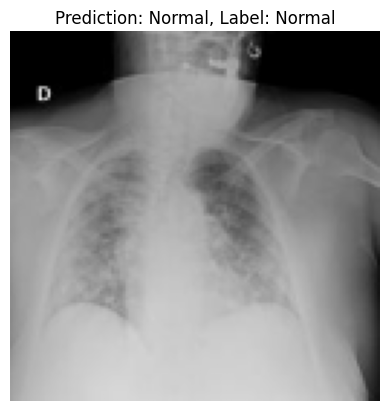

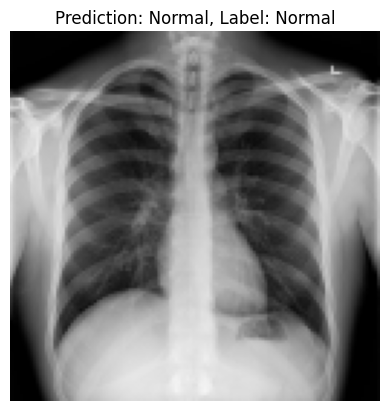

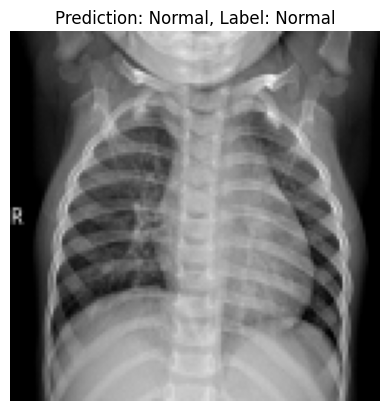

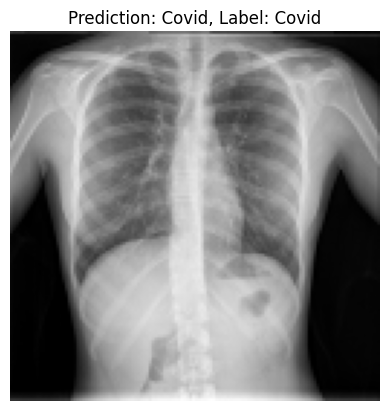

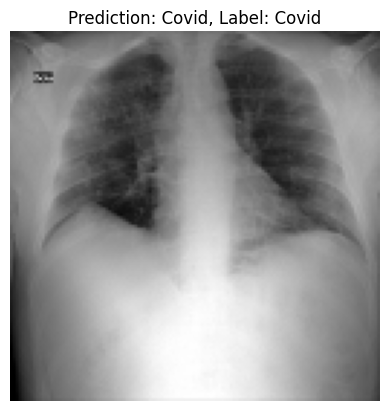

In [ ]:
import matplotlib.pyplot as plt

def show_image_with_prediction(image_array, prediction, label):
    plt.imshow(image_array)
    plt.axis('off')
    plt.title(f'Prediction: {prediction}, Label: {label}')
    plt.show()

image_arrays = X_test
predictions = result
label = real_result


for image_array, prediction, label in zip(image_arrays, predictions, label):
    show_image_with_prediction(image_array/255, prediction, label)